In [5]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plot

## Creating a numpy array from an image file

In [6]:
from skimage import data

photo_data = misc.imread('./wifire/sd-3layers.jpg')

type(photo_data)

numpy.ndarray

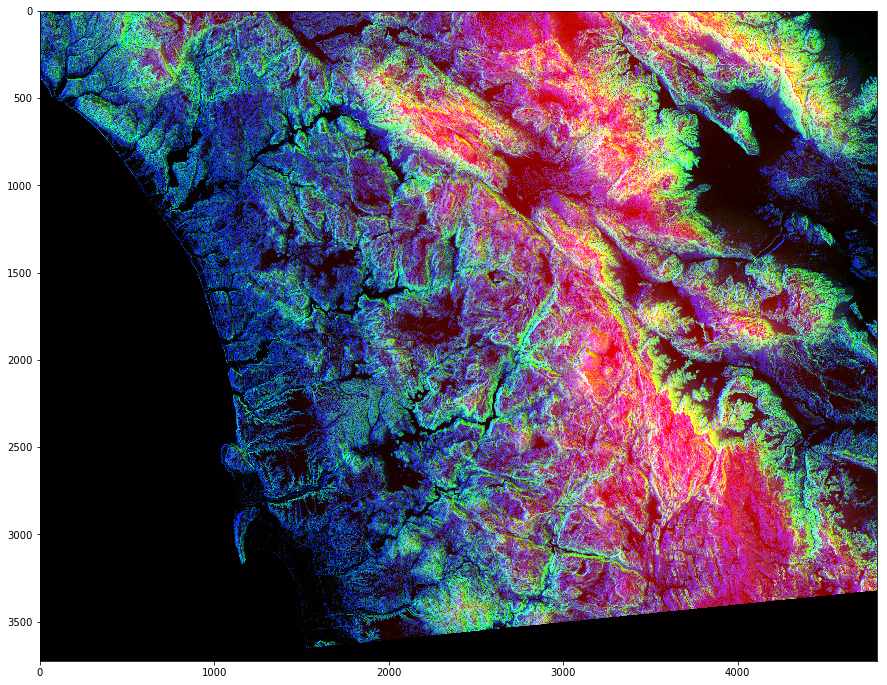

In [7]:
plot.figure(figsize=(15,15))
plot.imshow(photo_data)

In [8]:
photo_data.shape
#print(photo_data)

(3725, 4797, 3)

3725 - Height, 4797 - width, 3 - layer - RGB

* ### Red indicates the Altitude 
* ### Blue indicates the Aspect
* ### Green indicates slope

In [9]:
photo_data.size

53606475

In [10]:
photo_data.min(),photo_data.max()

(0, 255)

In [11]:
photo_data.mean()

75.8299354508947

In [12]:
photo_data[150,250]

array([ 17,  35, 255], dtype=uint8)

In [13]:
photo_data[150,250,1]

35

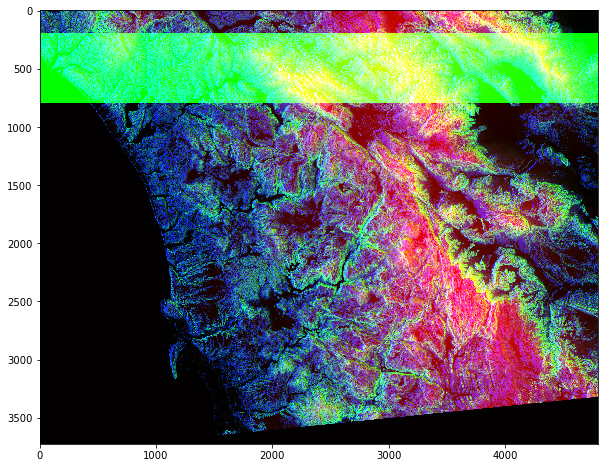

In [29]:
photo_data[200:800, : , 1] = 255 
plot.figure(figsize = (10,10))
plot.imshow(photo_data)

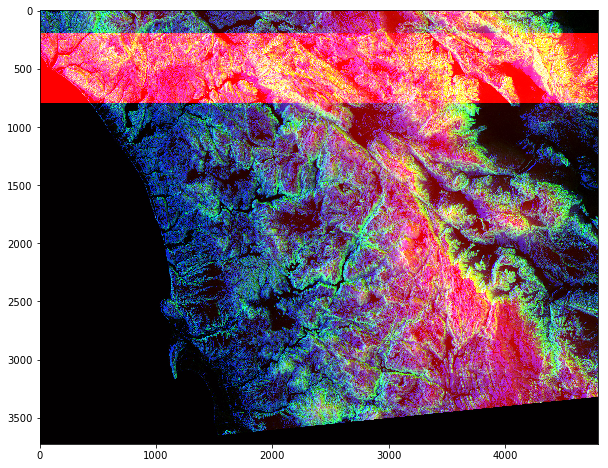

In [18]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

photo_data[200:800,:,0]=255
plot.figure(figsize=(10,10))
plot.imshow(photo_data)

In [19]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
print("Shape of photo data:",photo_data.shape)
low_value_filter = photo_data<200   #Creates a boolean ndarray of the same shape and filters out points of less intensity
print("Shape of low value filter:",low_value_filter.shape)

Shape of photo data: (3725, 4797, 3)
Shape of low value filter: (3725, 4797, 3)


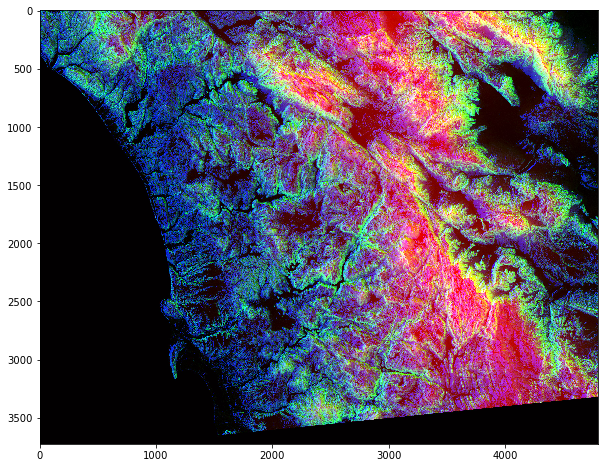

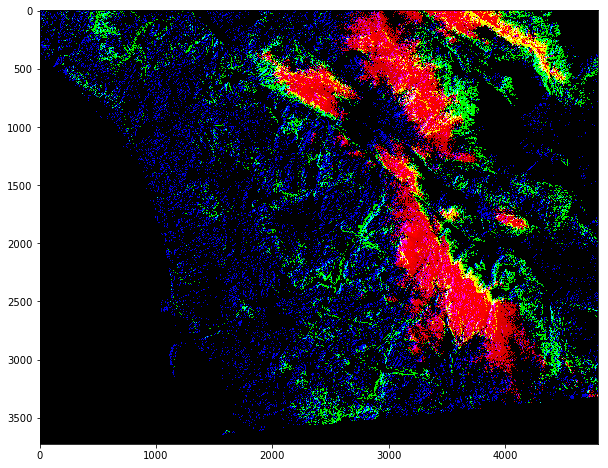

In [44]:
import random
plot.figure(figsize=(10,10))
plot.imshow(photo_data)
photo_data[low_value_filter]=0
plot.figure(figsize=(10,10))
plot.imshow(photo_data)

In [52]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [53]:
photo_data[rows_range,cols_range]=255

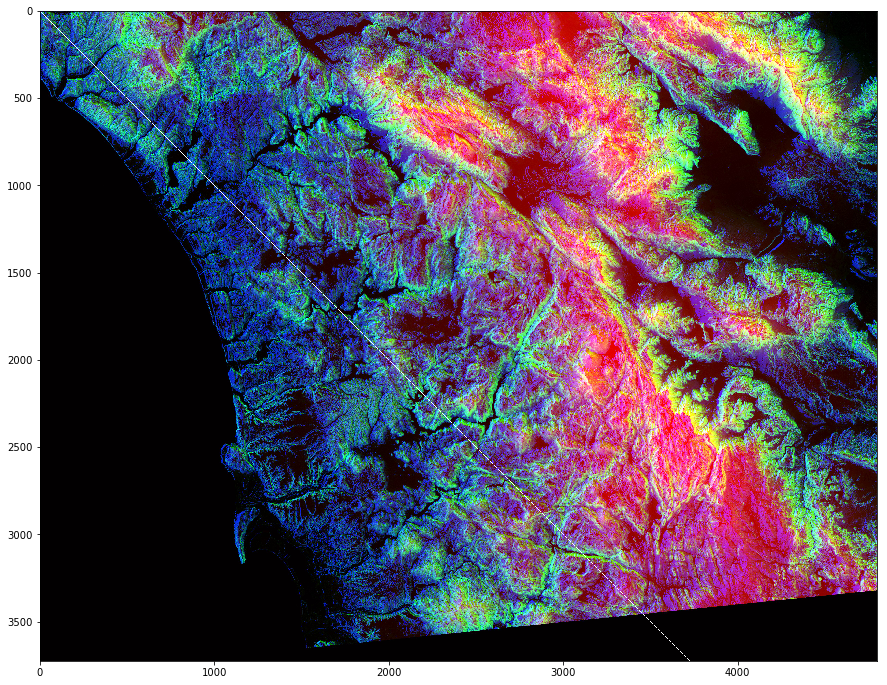

In [55]:
plot.figure(figsize = (15,15))
plot.imshow(photo_data)

## Masking

In [14]:
total_rows, total_cols, total_layers = photo_data.shape
#print("photo_data: ",photo_data.shape)
#print()
#print("total_rows",total_rows)
#print("total_cols",total_cols)
#print("total layers",total_layers)

X, Y = np.ogrid[:total_rows,:total_cols]
#print("shape of X is:",X.shape,"shape of y is:",Y.shape)

total_rows 3725


In [21]:
center_row, center_col = total_rows/2, total_cols/2
#print("center_row is", center_row)
dist_from_center = (X-center_row)**2+(Y-center_col)**2
#print(dist_from_center)
radius = (total_rows/2)**2
circular_mask = (dist_from_center>radius)
print(circular_mask)

[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


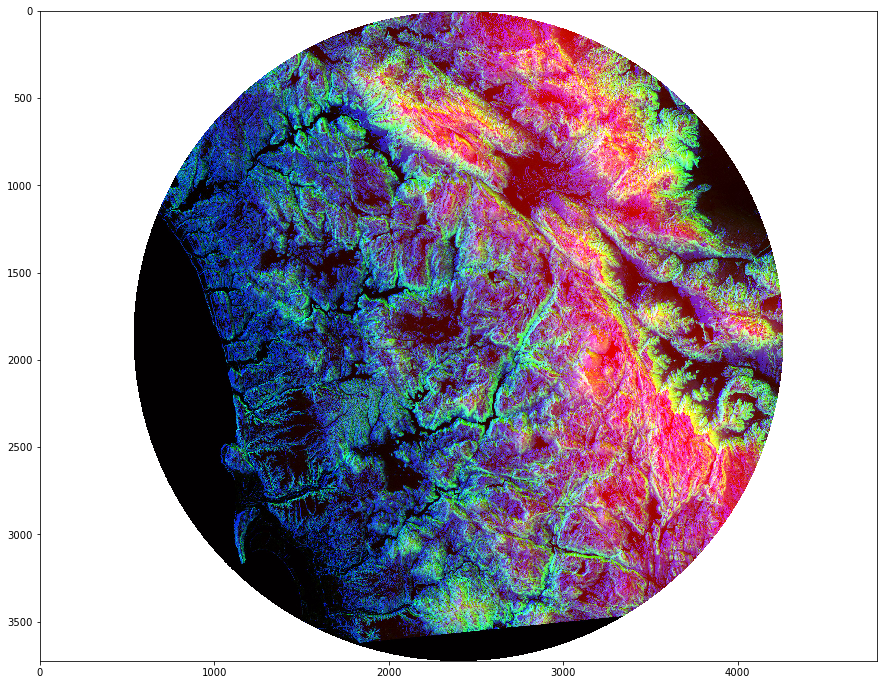

In [27]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[circular_mask]=255
plot.figure(figsize=(15,15))
plot.imshow(photo_data)

In [34]:
X, Y = np.ogrid[:total_rows, :total_cols]
#print(X,Y)
half_upper = X<center_row
half_upper_circular_mask = np.logical_and(half_upper,circular_mask)

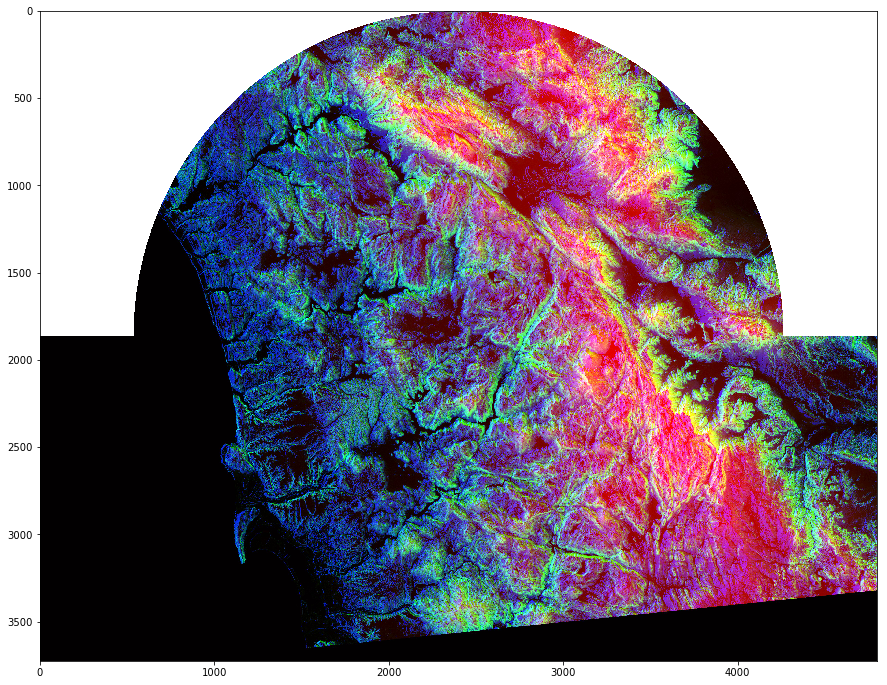

In [39]:
import random
photo_data = misc.imread('./wifire/sd-3layers.jpg')
#photo_data[half_upper_circular_mask]=255
photo_data[half_upper_circular_mask]=random.randint(250,255)
plot.figure(figsize=(15,15))
plot.imshow(photo_data)

## Creating masks for each layer in the image
* starting with Red layer

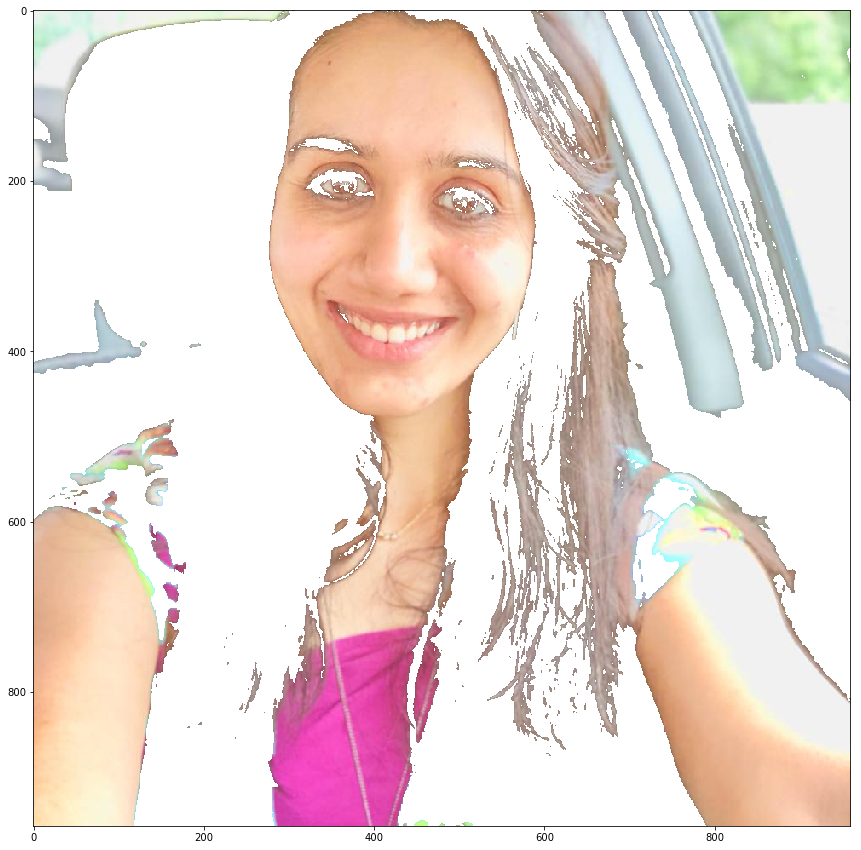

In [23]:
photo_data = misc.imread('./wifire/sneha.jpg')
red_mask = photo_data[:,:,0]<150
photo_data[red_mask]=255

plot.figure(figsize=(15,15))
plot.imshow(photo_data)

* Green layer

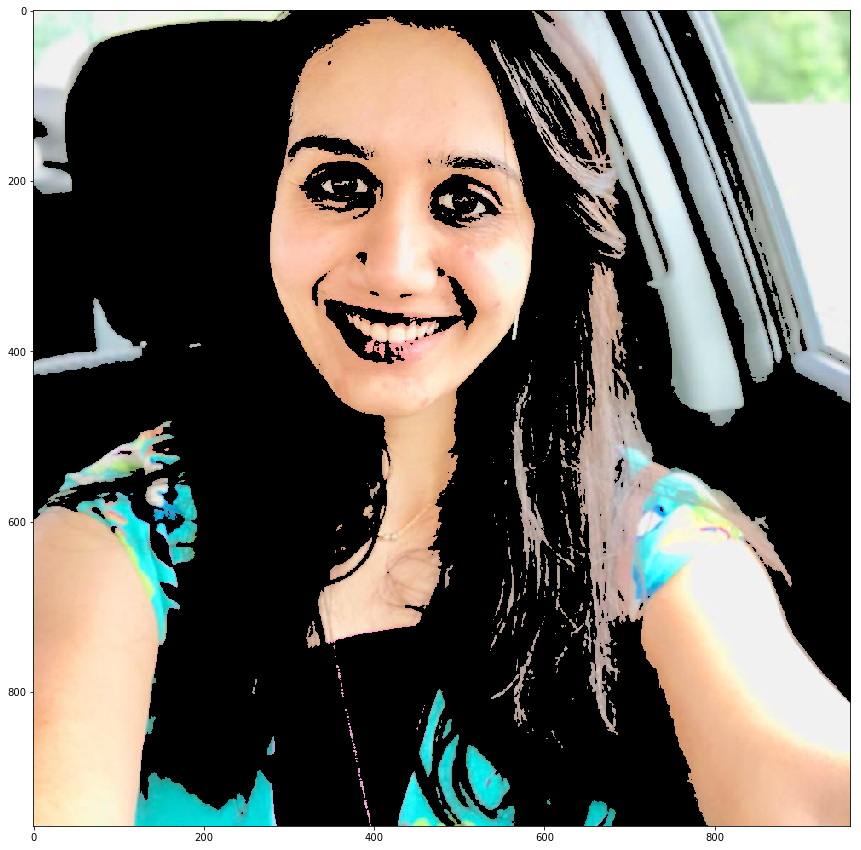

In [67]:
photo_data = misc.imread('./wifire/sneha.jpg')
green_mask = photo_data[:,:,1]<150
photo_data[green_mask]=0

plot.figure(figsize=(15,15))
plot.imshow(photo_data)

* blue filter

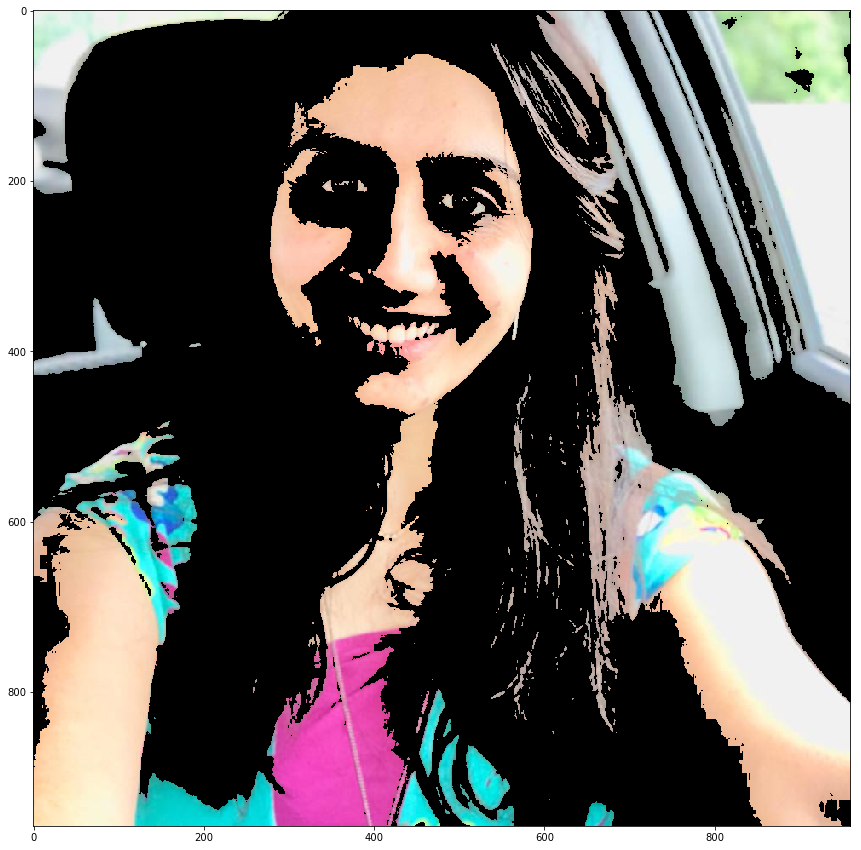

In [74]:
photo_data = misc.imread('./wifire/sneha.jpg')
blue_mask = photo_data[:,:,2]<150
photo_data[blue_mask]=0

plot.figure(figsize=(15,15))
plot.imshow(photo_data)

* custom filter

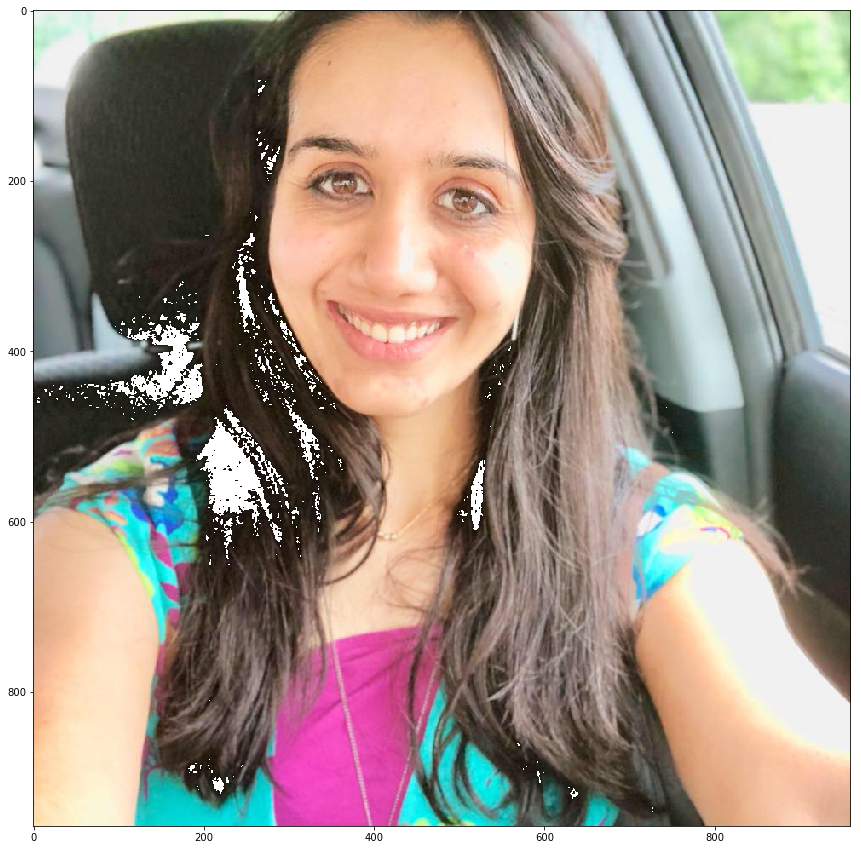

In [88]:
photo_data = misc.imread('./wifire/sneha.jpg')
red_filter = photo_data[:,:,0]<25
green_filter = photo_data[:,:,1]<25
blue_filter = photo_data[:,:,2]<25
all_filters = np.logical_and(red_filter,green_filter,blue_filter)

photo_data[all_filters]=255
plot.figure(figsize=(15,15))
plot.imshow(photo_data)